<a href="https://colab.research.google.com/github/CA683-Group99/Wind-Energy-Prediction/blob/main/3_SharedIslandElectricityEDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# System Demand and Generation: Actual and Prediction


In [60]:
# Importing global libraries

import numpy as np  # we will use it for linear algebra
import pandas as pd # we will use it data processing (our data is in CSV file so we read from pd.read_csv)

import io
import requests

# we will use plotty and seaborn for data exploration and data/model visualisation
from plotly.offline import iplot
import plotly.graph_objs as go
from plotly import tools
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.express as px
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')

from datetime import tzinfo, timedelta, datetime, date

## Data topic - Weather Data

## Data sources
 We obtained the weather data from specialised weather stations in the following locations: 
 * Belmullet (suffix _BEL), 
 * Dublin Airport (_DUB), 
 * Shannon Airport (No suffix) 
 * Cork Airport (suffix _COR)
 ---

For each station, for example Cork Airport, the data came from open data portal which is available on https://data.gov.ie/dataset/cork-airport-hourly-data.

The sample data from synoptic station at the Cork Airport stores rich historical information (last 30 years) and the data 
contains hourly elements. The overal structure is refreshed monthly and aggregates sensor data. It means that depending on the station for each hour we might have:

 * Precipitation Amount (mm);
 * Air Temperature (°C);
 * Wet Bulb Air Temperature (°C)
 * Dew Point Air Temperature (°C)
 * Vapour Pressure (hpa)
 * Relative Humidity (%)
 * Mean Sea Level Pressure (hPa)
 * Mean Hourly Wind Speed (kt)
 * Predominant Hourly wind Direction (kt)
 * Synop Code Present Weather
 * Synop Code Past Weather
 * Sunshine duration (hours)
 * Visibility (m)
 * Cloud Ceiling Height (100s feet)
 * Cloud Amount (octa)

---

 <br /><b>Each row in our data represents HOURLY measurmeent of above parameters across all synoptic stations</b>:
 * Belmullet (suffix _BEL), 
 * Dublin Airport (_DUB), 
 * Shannon Airport (No suffix) 
 * Cork Airport (suffix _COR)

---

 <br /><b>We have 24 measurements per every day and the data spans from midnight 01/01/2017 till 2PM on 01/01/2021.</b>

## The structure of the  data

We hafe the following hourly elements represented by certain attributes and metrics:

<!-- Krystian: I have changed formating to keep it clean-->
|    ID 	|                                     ELEMENT 	|      Unit 	|   	|   	|
|------:	|--------------------------------------------:	|----------:	|--:	|--:	|
|  rain 	|                        Precipitation Amount 	|        mm 	|   	|   	|
|  temp 	|                             Air Temperature 	|        °C 	|   	|   	|
|  wetb 	|                    Wet Bulb Air Temperature 	|        °C 	|   	|   	|
| dewpt 	|                   Dew Point Air Temperature 	|        °C 	|   	|   	|
| vappr 	|                             Vapour Pressure 	|       hpa 	|   	|   	|
|  rhum 	|                           Relative Humidity 	|         % 	|   	|   	|
|   msl 	|                     Mean Sea Level Pressure 	|       hPa 	|   	|   	|
|  wdsp 	|                      Mean Hourly Wind Speed 	|        kt 	|   	|   	|
| wddir 	|           Predominant Hourly wind Direction 	|        kt 	|   	|   	|
|    ww 	|   Synop Code Present Weather - decode below 	|           	|   	|   	|
|     w 	|      Synop Code Past Weather - decode below 	|           	|   	|   	|
|   sun 	|                           Sunshine duration 	|     hours 	|   	|   	|
|   vis 	|                                  Visibility 	|         m 	|   	|   	|
|  clht 	| Cloud Ceiling Height - if none value is 999 	| 100s feet 	|   	|   	|
| clamt 	|                                Cloud Amount 	|      okta 	|   	|   	|

## Data dictionary

* **System Demand** - represents the predicted electricity production required to meet national consumption.

* **date** - 
* **REGION** - All / Ireland / Nrthern Ireland
* **ActualDemandMW** - Unit MW
* **ForecastDemandMW** - 
* **ForecastWindMW** - 
* **ActualWindMW** - 
* **ActualGenerationMW** - 
* **hour** - 
* **isweekday** - 
* **month** - 
  
  ---

Actual and forecast System Demand are shown in **15 minute intervals.** The data came from EirGrid Group about all island power systems and has been prepared by us for further analysis.

Source: https://smartgriddashboard.eirgrid.com/#all/demand
<br/><br/>
---

**For the data from synoptic stations**
#### Indicators (i)	    Description  - Decode #### 
| Indicators (i) 	|                Description 	|                                   - Decode 	|   	|   	|
|---------------:	|---------------------------:	|-------------------------------------------:	|--:	|--:	|
|          irain 	|       Rainfall Indicators: 	|                           0. satisfactory. 	|   	|   	|
|                	|                            	|                             1. deposition. 	|   	|   	|
|                	|                            	|            2. trace or sum of precipition. 	|   	|   	|
|                	|                            	|             3. trace or sum of deposition. 	|   	|   	|
|                	|                            	|                 4. estimate precipitation. 	|   	|   	|
|                	|                            	|                     5 estimate deposition. 	|   	|   	|
|                	|                            	|        6. estimate trace of precipitation. 	|   	|   	|
|          itemp 	|    Temperature Indicators: 	|                               0. positive. 	|   	|   	|
|                	|                            	|                               1. negative. 	|   	|   	|
|                	|                            	|                     2. positive estimated. 	|   	|   	|
|                	|                            	|                     3. negative estimated. 	|   	|   	|
|                	|                            	|                          4. not available. 	|   	|   	|
|            iwb 	|       Wet Bulb Indicators: 	|                                0:positive. 	|   	|   	|
|                	|                            	|                               1. negative. 	|   	|   	|
|                	|                            	|                     2. positive estimated. 	|   	|   	|
|                	|                            	| 3. negative estimated.                     	|   	|   	|
|                	|                            	| 4. not available.                          	|   	|   	|
|                	|                            	| 5. frozen negative.                        	|   	|   	|
| iwdsp          	| Wind Speed Indicators:     	| 2. Over 60 minutes.                        	|   	|   	|
|                	|                            	| 4. Over 60 minutes and defective           	|   	|   	|
|                	|                            	| 6 Over 60 minutes and partially defective. 	|   	|   	|
|                	|                            	| 7. n/a                                     	|   	|   	|
| iwddir         	| Wind Direction Indicators: 	| 2. Over 60 minutes.                        	|   	|   	|
|                	|                            	| 4. Over 60 minutes and defective           	|   	|   	|
|                	|                            	| 6 Over 60 minutes and partially defective. 	|   	|   	|
|                	|                            	| 7. n/a                                     	|   	|   	|


#### WW  Code: WW=00-19 ####
* Present Weather - Weather at time of observation.
* Decode - SYNOP - ww in group 7wwW1W2

WW=00-19 No precipitation, fog,(except for 11 and 12), duststorm,  sandstorm, drifting or blowing snow at the station at the time of observation  or, except for 09 and 17, during the preceeding hour.

| 00 	| Cloud development not observed or observable }characteristic                                                                                                                                              	|                                              	|
|----	|-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------	|----------------------------------------------	|
| 01 	| Clouds dissolving or becoming less developed }state of sky                                                                                                                                                	|                                              	|
| 02 	| State of sky on the whole unchanged                                                                                                                                                                       	| }during the                                  	|
| 03 	| Clouds generally forming or developing                                                                                                                                                                    	| }past hour                                   	|
| 04 	| Visibility reduced by smoke haze                                                                                                                                                                          	|                                              	|
| 05 	| Haze                                                                                                                                                                                                      	|                                              	|
| 06 	| Widespread dust in suspension in the air, not raised by wind at or near the station at the time of observation.                                                                                           	|                                              	|
| 07 	| Dust or sand raised by the wind at or near the station at the time of the observation, but no well-developed dust whirl(s), and no sandstorm seen: or, in the case of ships, blowing spray at the station 	|                                              	|
| 08 	| Well developed dust whirl(s) or sand whirl(s) seen at or near the station during the preceding hour or at the time of observation, but no duststorm or sandstorm.                                         	|                                              	|
| 09 	| Duststorm or sandstorm within sight at the time of observation, or at the station during the preceding hour                                                                                               	|                                              	|
| 10 	| Mist                                                                                                                                                                                                      	|                                              	|
| 11 	| Patches of                                                                                                                                                                                                	| } shallow fog or ice fog                     	|
| 12 	| More or less continuous } less than 2 m on land or 10 m at sea                                                                                                                                            	|                                              	|
| 13 	| Lightning visible, no thunder heard                                                                                                                                                                       	|                                              	|
| 14 	| Precipitation within sight, not reaching the ground or surface of sea                                                                                                                                     	|                                              	|
| 15 	| Precipitation within sight, reaching ground or the surface of the sea, but distant, i.e. estimated to                                                                                                     	| be more than 5 km from the station           	|
|    	|                                                                                                                                                                                                           	|                                              	|
| 16 	| Precipitation within sight, reaching the ground or the surface of the sea, near to, but not at the station                                                                                                	|                                              	|
| 17 	| Thunderstorm, but no precipitation at the time of observation                                                                                                                                             	|                                              	|
| 18 	| Squalls                                                                                                                                                                                                   	| } at or within sight of                      	|
|    	|                                                                                                                                                                                                           	| ) the station during                         	|
| 19 	| Funnel cloud(s) during                                                                                                                                                                                    	| the preceding hour or at time of observation 	|

#### WW  Code: WW=20-29 ####
recipitation, fog, ice fog or thunderstorm at the station during the preceeding hour but not at the time observation.

| 20 	| Drizzle (not freezing) or snow grains }      	|   	|              	|
|----	|----------------------------------------------	|---	|--------------	|
| 21 	| Rain (not freezing)                          	| } 	| Not          	|
| 22 	| Snow                                         	| } 	| falling      	|
| 23 	| Rain and snow or ice pellets                 	| } 	| as shower(s) 	|
| 24 	| Freezing drizzle or freezing rain            	| } 	|              	|
| 25 	| Shower(s) of rain                            	|   	|              	|
| 26 	| Shower(s) of snow, or of rain and snow       	|   	|              	|
| 27 	| Shower(s) of hail, or of rain and hail       	|   	|              	|
| 28 	| Fog or ice fog                               	|   	|              	|
| 29 	| Thunderstorm (with or without precipitation) 	|   	|              	|

#### WW  Code: WW=30-39 ####
Duststorm, sandstorm, drifting or blowing snow.

| 30 	| Slight or                          	| } has decreased during the preceding hour          	|                   	|
|----	|------------------------------------	|----------------------------------------------------	|-------------------	|
| 31 	| moderate duststorm                 	| }no appreciable change during the preceding hour   	|                   	|
| 32 	| or sandstorm                       	| } has begun or increased during the preceding hour 	|                   	|
| 33 	| Severe                             	| } has decreased during the preceding hour          	|                   	|
| 34 	| duststorm                          	| } no appreciable change during the preceding hour  	|                   	|
| 35 	| or sandstorm                       	| } has begun or increased during the preceding hour 	|                   	|
| 36 	| Slight or moderate drifting snow } 	| Generally low                                      	|                   	|
| 37 	| Heavy drifting snow                	| }                                                  	| (below eye level) 	|
| 38 	| Slight or moderate blowing snow }  	| Generally high                                     	|                   	|
| 39 	| Heavy blowing snow                 	| }                                                  	| (above eye level) 	|   


#### WW  Code: WW=40-49 ####
Fog or ice fog at the time of observation

| 40 	| Fog or ice fog at a distance at the time of observation, but not at the station during the preceding hour,the fog or ice fog extending to a level above that of the observer 	|   	|                                 	|
|----	|------------------------------------------------------------------------------------------------------------------------------------------------------------------------------	|---	|---------------------------------	|
| 41 	| Fog or ice fog in patches                                                                                                                                                    	|   	|                                 	|
| 42 	| Fog or ice fog, sky visible                                                                                                                                                  	| } 	| has become thinner during       	|
| 43 	| Fog or ice fog, sky obscured                                                                                                                                                 	| } 	| preceding hour                  	|
| 44 	| Fog or ice fog, sky visible                                                                                                                                                  	| } 	| no appreciable change           	|
| 45 	| Fog or ice fog, sky obscured                                                                                                                                                 	| } 	| during the preceding hour       	|
| 46 	| Fog or ice fog, sky visible                                                                                                                                                  	| } 	| has begun or has become thicker 	|
| 47 	| Fog or ice fog, sky obscured                                                                                                                                                 	| } 	| during the preceding hour       	|
| 48 	| Fog or ice fog, sky visible                                                                                                                                                  	|   	|                                 	|
| 49 	| Fog or ice fog, sky obscured                                                                                                                                                 	|   	|                                 	|


#### WW  Code: WW=50-59 ####
Drizzle

| 50 	| Drizzle, not freezing, intermittent }        	| slight at time        	|                	|
|----	|----------------------------------------------	|-----------------------	|----------------	|
| 51 	| Drizzle, not freezing, continuous            	| }                     	| of observation 	|
| 52 	| Drizzle, not freezing, intermittent }        	| moderate at time      	|                	|
| 53 	| Drizzle, not freezing, continuous            	| }                     	| of observation 	|
| 54 	| Drizzle, not freezing, intermittent }        	| heavy (dense) at time 	|                	|
| 55 	| Drizzle, not freezing, continuous            	| }                     	| of observation 	|
| 56 	| Drizzle, freezing, slight                    	|                       	|                	|
| 57 	| Drizzle, freezing, moderate or heavy (dense) 	|                       	|                	|
| 58 	| Drizzle and rain, slight                     	|                       	|                	|
| 59 	| Drizzle and rain, moderate or heavy          	|                       	|                	|

#### WW  Code: WW=60-69 ####
Rain

| 60 	| Rain, not freezing, intermittent            	| } 	| Slight at time   	|
|----	|---------------------------------------------	|---	|------------------	|
| 61 	| Rain, not freezing, continuous              	| } 	| of observation   	|
| 62 	| Rain, not freezing, intermittent            	| } 	| Moderate at time 	|
| 63 	| Rain, not freezing, continuous              	| } 	| of observation   	|
| 64 	| Rain, not freezing, intermittent            	| } 	| Heavy at time    	|
| 65 	| Rain, not freezing, continuous              	| } 	| of observation   	|
| 66 	| Rain, freezing, slight                      	|   	|                  	|
| 67 	| Rain, freezing, moderate or heavy           	|   	|                  	|
| 68 	| Rain or drizzle and snow, slight            	|   	|                  	|
| 69 	| Rain or drizzle and snow, moderate or heavy 	|   	|                  	|

#### WW  Code: WW=70-79 ####
Solid precipitation not in showers.

| 70 	| Intermittent fall of snowflakes                        	| } 	| slight at time   	|
|----	|--------------------------------------------------------	|---	|------------------	|
| 71 	| Continuous fall of snowflakes                          	| } 	| of observation   	|
| 72 	| Intermittent fall of snowflakes                        	| } 	| moderate at time 	|
| 73 	| Continuous fall of snowflakes                          	| } 	| of observation   	|
| 74 	| Intermittent fall of snowflakes                        	| } 	| heavy at time    	|
| 75 	| Continuous fall of snowflakes                          	| } 	| of observation   	|
| 76 	| Diamond dust (with or without fog)                     	|   	|                  	|
| 77 	| Snow grains (with or without fog)                      	|   	|                  	|
| 78 	| Isolated star-like snow crystals (with or without fog) 	|   	|                  	|
| 79 	| Ice pellets                                            	|   	|                  	|

#### WW  Code: WW=80-99 ####
Showery precipitation, or precipitation with current or recent thunderstorm.

| 80 	| Rain shower(s), slight                                                	|                      	|
|----	|-----------------------------------------------------------------------	|----------------------	|
| 81 	| Rain shower(s), moderate or heavy                                     	|                      	|
| 82 	| Rain shower(s), violent                                               	|                      	|
| 83 	| Shower(s) of rain and snow mixed, slight                              	|                      	|
| 84 	| Shower(s) of rain and snow mixed, moderate or heavy                   	|                      	|
| 85 	| Snow shower(s), slight                                                	|                      	|
| 86 	| Snow shower(s), moderate or heavy                                     	|                      	|
| 87 	| Shower(s) of snow pellets or small hail                               	| }- slight            	|
| 88 	| with or without rain or rain and snow mixed                           	| }- moderate or heavy 	|
| 89 	| Shower(s) of hail, with or without rain or                            	| }- slight            	|
| 90 	| rain and snow mixed, not associated with thunder }- moderate or heavy 	|                      	|

#### WW  Code: WW=91-94 ####
Thunderstorm during the preceeding hour but not at time of observation.

| 91                     	| Slight rain at time of observation                                   	|
|------------------------	|----------------------------------------------------------------------	|
| 92                     	| Moderate or heavy rain at time of observation                        	|
| 93                     	| Slight snow, or rain and snow mixed, or hail2 at time of observation 	|
| 94                     	| Moderate or heavy snow, or rain and snow mixed, or hail1             	|
| at time of observation 	|                                                                      	|


#### WW  Code: WW=95-99 ####
Thunderstorm at time of observation.

| 95 	| Thunderstorm, slight or moderate, without hail2 but with rain and or snow at time of observation 	|
|----	|--------------------------------------------------------------------------------------------------	|
| 96 	| Thunderstorm, slight or moderate, with hail2 at time of observation                              	|
| 97 	| Thunderstorm, heavy, without hail2 but with rain and or snow at time of observation              	|
| 98 	| Thunderstorm combined with dust storm or sandstorm at time of observation                        	|
| 99 	| Thunderstorm, heavy, with hail2 at time of observation                                           	|


* The expression at the station refers to a land station or a ship             

1 Tornado cloud or waterspout                                                  
2 Hail, small hail, snow pellets                                               


#### W - Code figures####

Past Weather - Weather during past hour  
Decode - SYNOP – W1,W2 in group 7wwW1W2                   

Code figure

| 0 Cloud covering 1/2 or less of the sky throughout the appropriate period                                                           	|   	|
|-------------------------------------------------------------------------------------------------------------------------------------	|---	|
| 1 Cloud covering more than 1/2 of the sky during part of the appropriate period and covering 1/2 or less during part of the period. 	|   	|
| 2 Cloud covering more than 1/2 of the sky throughout the appropriate period                                                         	|   	|
| 3 Sandstorm, duststorm or blowing snow                                                                                              	|   	|
| 4 Fog or ice fog or thick haze                                                                                                      	|   	|
| 5 Drizzle                                                                                                                           	|   	|
| 6 Rain                                                                                                                              	|   	|
| 7 Snow, or rain and snow mixed                                                                                                      	|   	|
| 8 Shower(s)                                                                                                                         	|   	|
| 9 Thunderstorm(s) with or without precipitation                                                                                     	|   	|

## Data understanding

<Center><img src='https://www.sv-europe.com/wp-content/uploads/2016/04/Screenshot-2016-04-20-11.58.54.png' height='450' width='450'/></Center>

---
2. ***Data understanding***. We should cover here:								
* Initial data collection - 	where the data came from 					
* Data description 	
* Data exploration 							
* Distribution of key attributes					
* Relationships between pairs or small numbers of attributes		* Results of simple aggregations						
* Properties of significant sub-populations						
* Simple statistical analyses						
* Data quality							
* Is the data complete (does it cover all the cases required)?	
* Is it correct, or does it contain errors and, if there are errors, how common are they?						
* Are there missing values in the data? If so, how are they represented, where do they occur, and how common are they?						



In [61]:
from google.colab import drive
drive.mount('/content/drive')

import os
os.chdir('/content/drive/MyDrive/CA683Project')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [62]:
  fileP = 'Data/IslandElectricity2017_2020v4.csv'
  newdf = pd.read_csv(fileP, parse_dates=[1], na_values=" ")

#### Checking the size of the data ####

In [63]:
print('----------- Looking for understanding the size of the data -------------')
print(newdf.shape)           # 96 Columns, 35083 rows

# Splitting this into two variables for better readibility
count_row = newdf.shape[0]   # 96 Columns
count_col = newdf.shape[1]   # 35083 rows
print('Rows: ', count_row, ', Columns: ', count_col)

----------- Looking for understanding the size of the data -------------
(32136, 77)
Rows:  32136 , Columns:  77


#### Checking the list, types, gaps of the data ####

In [64]:
print('-----------Listing all the columns that we have in data/dictionary-------------')
# casting them to the list for better readibility (and work on the model later)
columns = newdf.columns.values.tolist() 
print (columns)

-----------Listing all the columns that we have in data/dictionary-------------
['Unnamed: 0', 'date', 'rain_BEL', 'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL', 'msl_BEL', 'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB', 'wetb_DUB', 'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB', 'wddir_DUB', 'ww_DUB', 'w_DUB', 'sun_DUB', 'vis_DUB', 'clht_DUB', 'clamt_DUB', 'rain', 'temp', 'wetb', 'dewpt', 'vappr', 'rhum', 'msl', 'wdsp', 'wddir', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain_COR', 'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR', 'wdsp_COR', 'wddir_COR', 'ww_COR', 'w_COR', 'sun_COR', 'vis_COR', 'clht_COR', 'clamt_COR', 'rain_MAL', 'temp_MAL', 'wetb_MAL', 'dewpt_MAL', 'vappr_MAL', 'rhum_MAL', 'msl_MAL', 'wdsp_MAL', 'wddir_MAL', 'Unnamed: 0.1', 'ActualDemandMW', 'ForecastWndMW', 'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'WindMWPercent', 'hour', 'isweekday', 'month', 'year', 'TotalWindCapacityMW']


In [65]:
print('-----------Listing all the columns, their names, count of null/not null and type -------------')
print('-----------Checking completness of the data, their types and naming convention -------------')
print(newdf.info())

-----------Listing all the columns, their names, count of null/not null and type -------------
-----------Checking completness of the data, their types and naming convention -------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32136 entries, 0 to 32135
Data columns (total 77 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Unnamed: 0           32136 non-null  int64         
 1   date                 32136 non-null  datetime64[ns]
 2   rain_BEL             32136 non-null  float64       
 3   temp_BEL             32136 non-null  float64       
 4   wetb_BEL             32136 non-null  float64       
 5   dewpt_BEL            32136 non-null  float64       
 6   vappr_BEL            32136 non-null  float64       
 7   rhum_BEL             32136 non-null  int64         
 8   msl_BEL              32136 non-null  float64       
 9   wdsp_BEL             32136 non-null  int64         
 10  wddir_BEL     

#### Checking statistical characteristic of each attribute of the data ####

In [66]:
print('-----------Checking Basic Statistical Characteristic of each attribute in one way-------------')
newdf.describe()

# df.apply(pd.DataFrame.describe, axis=1)

-----------Checking Basic Statistical Characteristic of each attribute in one way-------------


,Unnamed: 0,rain_BEL,temp_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,wdsp_BEL,wddir_BEL,rain_DUB,temp_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,wdsp_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,clht_DUB,clamt_DUB,rain,temp,wetb,dewpt,vappr,rhum,msl,wdsp,wddir,ww,w,sun,vis,clht,clamt,rain_COR,temp_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,wdsp_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,rain_MAL,temp_MAL,wetb_MAL,dewpt_MAL,vappr_MAL,rhum_MAL,msl_MAL,wdsp_MAL,wddir_MAL,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,month,year,TotalWindCapacityMW
count,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.00000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.00000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000
mean,16067.500000,0.164712,10.373562,8.976537,7.390830,10.669318,82.046832,1011.091688,12.236090,201.229773,0.089949,9.794007,8.305038,6.652496,10.207807,81.924104,1012.612880,9.811209,207.656211,15.121982,29.825523,0.162979,27910.191063,288.130072,5.636202,0.129991,10.592180,8.889940,7.474188,10.756619,82.179145,1012.78825,9.182070,193.265808,18.070606,35.669841,0.153968,22181.080408,281.377738,5.666169,0.153613,9.980813,8.677763,7.576304,10.852300,86.039706,1013.488754,9.916604,214.841299,17.345563,32.903846,0.169414,28133.89532,286.156865,5.589619,0.141271,10.018864,8.584513,6.915746,10.333215,81.146876,1010.576049,15.221278,200.905215,16067.500000,4213.433431,1410.427324,1372.008472,4255.746048,-11.428009,32.938907,11.500000,6.707991,2018.814040,5009.629385
std,9277.008462,0.517029,3.996363,3.798958,4.242203,3.011946,10.997996,13.367484,6.698996,92.285335,0.424251,5.102580,4.506006,4.553134,3.154785,12.031337,12.682835,4.810974,80.978585,22.974468,27.028785,0.318781,13660.864219,399.910817,2.251620,0.473468,4.895687,5.425763,4.377861,3.157159,12.043438,12.70248,5.280982,86.777474,23.689797,29.224839,0.313976,12486.633522,408.467535,2.418876,0.569093,4.633844,5.234230,4.487369,3.240646,12.084446,12.396956,5.170618,83.475835,23.552764,27.951275,0.331621,18072.29915,419.024988,2.396005,0.483860,3.924007,3.787464,4.248036,2.955960,9.747739,13.427848,7.317719,85.470056,9277.008462,848.776649,1094.062884,987.325954,753.511004,526.517442,23.152582,6.922294,3.528963,1.112341,446.423214
min,0.000000,0.000000,-3.300000,-4.400000,-9.700000,2.900000,35.000000,959.100000,0.000000,10.000000,0.000000,-5.600000,-49.900000,-8.900000,3.100000,25.000000,965.900000,0.000000,0.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,0.000000,-4.800000,-49.000000,-8.300000,3.300000,24.000000,967.30000,0.000000,0.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,0.000000,-6.900000,-49.000000,-9.200000,3.100000,26.000000,970.100000,0.000000,0.000000,1.000000,0.000000,0.000000,15.00000,1.000000,0.000000,0.000000,-2.000000,-3.000000,-7.900000,3.400000,20.000000,956.600000,1.000000,10.000000,0.000000,2394.750000,0.000000,-44.750000,1939.250000,-1415.000000,-0.943098,0.000000,1.000000,2017.000000,4096.494000
25%,8033.750000,0.000000,7.575000,6.200000,4.200000,8.300000,75.000000,1002.400000,7.000000,150.000000,0.000000,6.200000,5.100000,3

#### Checking frequencies of each data types ####

In [67]:
print('-----------Checking the data types -------------')

# this below is giving me 96 columns which I aggretated by 
# print(newdf.dtypes) 

# Aggregated number of data types that we have in our base table
print(newdf.dtypes.value_counts())

-----------Checking the data types -------------
float64           49
int64             26
datetime64[ns]     1
bool               1
dtype: int64


#### Checking missing data, potential frequencies, reasons and gaps - if exsists ####

-----------Checking missing data - here providing bar of all attributes to see if there are gaps -------------


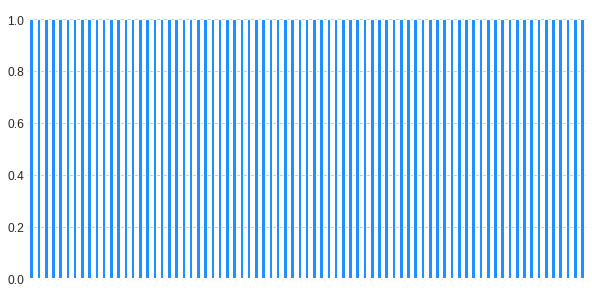

In [68]:
print('-----------Checking missing data - here providing bar of all attributes to see if there are gaps -------------')
import missingno
missingno.bar(newdf, color="dodgerblue", sort="ascending", figsize=(10,5), fontsize=12);

-----------Checking missing data - here to zoom it I am checking selected attribute to see if there are gaps -------------


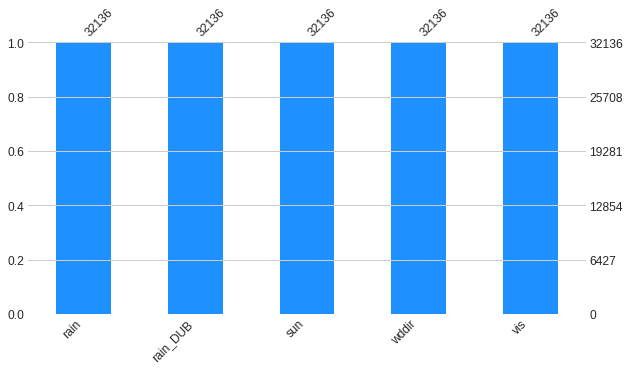

In [69]:
print('-----------Checking missing data - here to zoom it I am checking selected attribute to see if there are gaps -------------')
import missingno
missingno.bar(newdf[['rain','rain_DUB','sun','wddir','vis']], color="dodgerblue", sort="ascending", figsize=(10,5), fontsize=12);

#### Checking correlation of missing data by using missingness correlation ####

-----------Checking correlation of missing data -------------


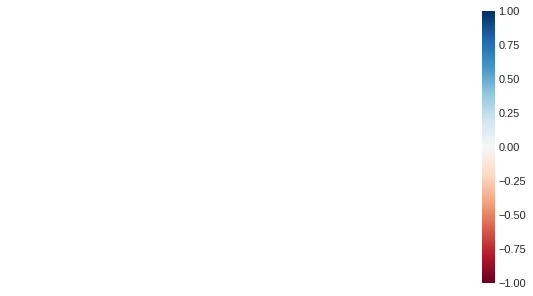

In [70]:
print('-----------Checking correlation of missing data -------------')
# how to read this: if one attribute is missing what is the correlation that another one will be missing.
# for example year month and weekday or actual wind, forecase wind and others
missingno.heatmap(newdf, figsize=(10,5), fontsize=12);

#### Checking correlation of missing data by using clusters and dendrograms ####

-----------Checking clusters of potential missing data by using dendrogram -------------


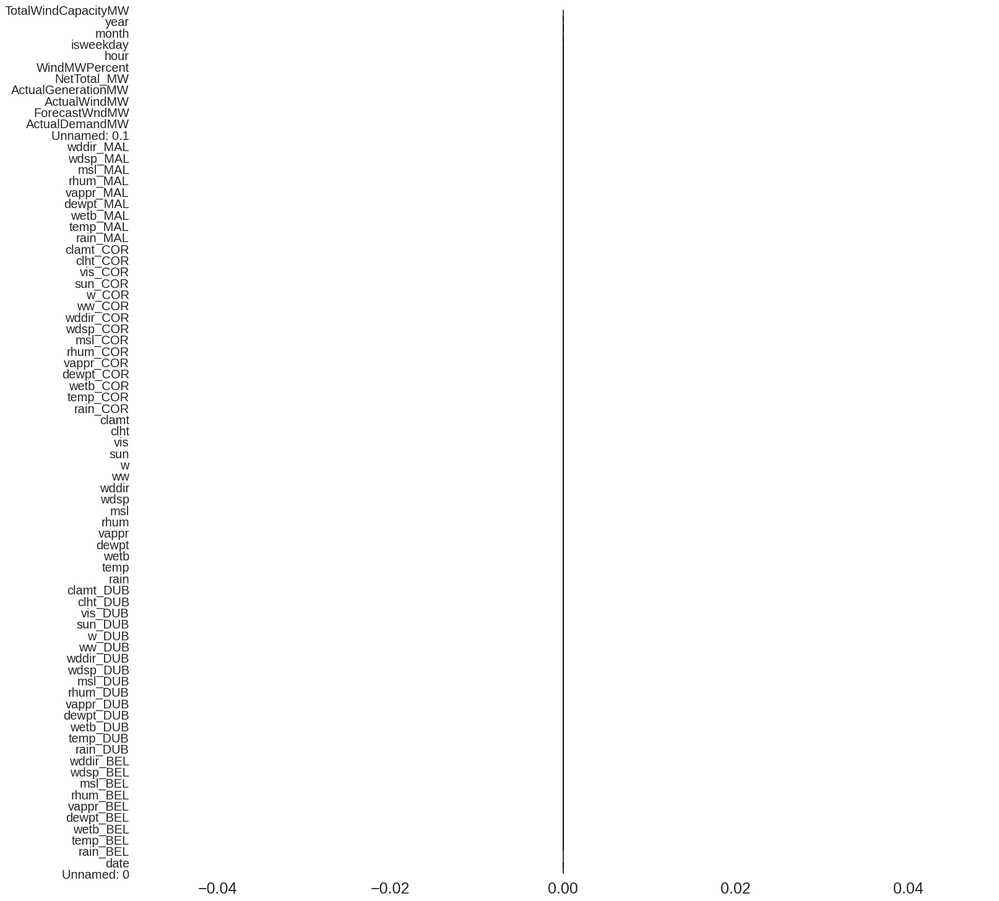

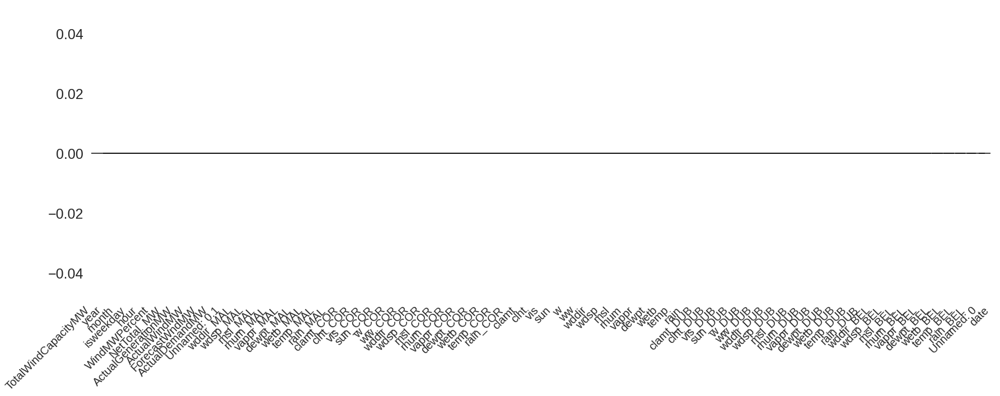

In [71]:
print('-----------Checking clusters of potential missing data by using dendrogram -------------')
# I am plotting two dendrograms which show us the clusters of attributes. 

# If they are keep together that means that they do not have missing values.
# There is a nullity correlation between ActualWindMW, ActualDemandMW and ActualGenerationMW and ActualWindMW so they are in one cluster

# I also used centroids for the clustering and then ward method for comparison (both used in clustering)

# fig = plt.figure(figsize=(15,7))
# ax1 = fig.add_subplot(1,2,1)
# ax2 = fig.add_subplot(1,2,2)

missingno.dendrogram(newdf, orientation="right", method="centroid", fontsize=20);
missingno.dendrogram(newdf, orientation="top", method="ward", fontsize=20);

plt.tight_layout()

In [72]:
print('-----------Printing only numeric attributes (84) from our data -------------')

# this is my white list of types that I want to filter in
allowed_types = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

# print(newdf.select_dtypes(include=[np.number]).dtypes)

display(newdf.select_dtypes(include=allowed_types))
# print(newdf._get_numeric_data()) - above line will do the same but in more readable way FYI group

-----------Printing only numeric attributes (84) from our data -------------


,Unnamed: 0,rain_BEL,temp_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,wdsp_BEL,wddir_BEL,rain_DUB,temp_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,wdsp_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,clht_DUB,clamt_DUB,rain,temp,wetb,dewpt,vappr,rhum,msl,wdsp,wddir,ww,w,sun,vis,clht,clamt,rain_COR,temp_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,wdsp_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,rain_MAL,temp_MAL,wetb_MAL,dewpt_MAL,vappr_MAL,rhum_MAL,msl_MAL,wdsp_MAL,wddir_MAL,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,month,year,TotalWindCapacityMW
0,0,0.0,12.3,11.3,10.3,12.5,88,1017.6,8,200,0.0,8.5,7.4,6.2,9.4,85.0,1018.0,7,270,2,11,0.0,40000,999,1,0.0,10.6,9.5,8.4,11.0,86.0,1020.1,6,260,2,11,0.0,30000,999,0,0.0,10.0,8.7,7.2,10.2,83.0,1020.7,7,280,2,11,0.0,30000.0,999,2,0.0,9.9,8.7,7.3,10.2,84,1016.8,10,270.0,0.0,2394.75,287.00,280.25,2580.75,-221.00,11.702683,0.0,7.0,2017.0,4096.494
1,1,0.0,12.5,11.4,10.4,12.6,87,1016.9,10,200,0.0,8.0,7.0,5.9,9.2,86.0,1018.2,9,270,2,11,0.0,40000,999,1,0.0,10.4,9.5,8.5,11.1,88.0,1019.8,4,240,2,11,0.0,30000,999,2,0.0,9.6,8.3,6.8,9.9,83.0,1020.5,7,280,2,11,0.0,30000.0,999,1,0.0,10.0,8.8,7.5,10.3,84,1016.2,10,260.0,1.0,2961.50,319.50,423.25,3402.00,-406.75,14.291744,1.0,7.0,2017.0,4096.494
2,2,0.0,13.0,11.9,10.9,13.0,86,1016.2,14,200,0.0,7.5,6.9,6.2,9.5,91.0,1018.0,8,270,2,11,0.0,40000,999,1,0.0,10.0,9.5,9.0,11.5,93.0,1019.6,2,190,2,11,0.0,30000,999,2,0.0,9.7,8.4,7.0,10.0,83.0,1020.2,7,280,2,11,0.0,30000.0,999,1,0.0,10.0,9.2,8.3,10.9,88,1015.8,10,220.0,2.0,2785.25,320.00,451.25,3411.75,-388.00,16.201418,2.0,7.0,2017.0,4096.494
3,3,0.0,12.9,12.0,11.2,13.3,89,1015.6,16,210,0.0,7.2,6.7,6.1,9.4,93.0,1018.0,9,270,2,11,0.0,60000,999,0,0.0,11.1,10.2,9.4,11.7,89.0,1018.8,5,190,2,11,0.0,20000,23,7,0.0,8.8,7.9,6.9,9.9,88.0,1019.9,4,280,2,11,0.0,30000.0,999,1,0.0,8.9,8.1,7.2,10.1,89,1015.4,10,190.0,3.0,2716.25,347.50,512.75,3500.00,-534.75,18.877128,3.0,7.0,2017.0,4096.494
4,4,0.0,13.3,12.7,12.2,14.2,93,1015.0,17,210,0.0,7.6,7.0,6.3,9.5,91.0,1017.7,8,250,2,11,0.0,60000,999,1,0.0,11.5,10.4,9.4,11.7,86.0,1018.3,4,170,2,11,0.0,20000,23,7,0.0,8.5,7.6,6.6,9.7,88.0,1019.6,5,270,2,11,0.0,30000.0,18,5,0.0,8.7,7.9,7.0,10.0,89,1015.2,10,190.0,4.0,2654.00,410.50,576.75,3330.00,-430.50,21.731349,4.0,7.0,2017.0,4096.494
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32131,32131,0.0,5.1,4.0,2.4,7.2,82,1034.2,4,360,0.0,5.7,5.0,4.1,8.2,89.0,1036.0,7,80,2,11,0.0,2000,9,7,0.0,7.6,5.2,1.6,6.9,66.0,1033.9,3,60,2,11,0.0,35000,999,0,0.0,5.5,5.2,4.7,8.6,95.0,1033.8,6,80,10,0,0.0,6000.0,999,1,0.0,5.6,4.8,3.7,8.0,87,1035.2,9,130.0,32131.0,5288.00,602.50,571.75,4562.25,721.50,10.812216,19.0,2.0,2021.0,5531.095
32132,32132,0.0,3.8,3.0,1.8,6.9,86,1034.2,2,10,0.0,4.8,4.0,2.8,7.5,87.0,1035.9,6,80,2,11,0.0,20000,9,6,0.0,5.3,3.7,1.3,6.7,75.0,1033.9,4,50,2,11,0.0,25000,999,0,0.0,5.1,4.8,4.3,8.4,95.0,1033.8,7,70,10,0,0.0,16000.0,999,1,0.0,5.7,5.2,4.6,8.5,92,1035.1,7,150.0,32132.0,4913.25,719.00,809.75,4219.75,682.00,16.480944,20.0,2.0,2021.0,5531.095
32133,32133,0.0,3.4,2.9,2.0,7.0,90,1034.0,5,360,0.0,3.3,3.3,3.3,7.7,100.0,1035.8,5,100,10,11,0.0,5000,999,3,0.0,4.5,3.3,1.5,6.8,81.0,1033.9,4,50,2,11,0.0,20000,999,0,0.0,4.9,4.3,3.4,7.8,90.0,1033.6,8,60,2,11,0.0,18000.0,999,1,0.0,4.9,4.6,4.0,8.1,93,1035.3,5,200.0,32133.0,4540.50,782.75,976.75,4059.25,466.25,21.511948,21.0,2.0,2021.0,5531.095
32134,32134,0.0,2.9,2.5,1.7,6.9,91,1033.8,3,40,0.0,2.4,2.2,1.8,7.0,96.0,1035.5,5,100,10,0,0.0,7000,999,1,0.0,3.0,2.3,1.1,6.6,88.0,1033.8,1,70,2,11,0.0,20000,999,0,0.0,4.9,4.1,3.0,7.5,87.0,1033.3,8,80,2,11,0.0,20000.0,999,1,0.0,4.7,4.3,3.7,8.0,93,1035.0,6,160.0,32134.0,4156.75,776.75,1039.25,3798.25,348.25,25.00150

#### Checking the size of the data in the memory ####

In [73]:
print('-----------Checking the size of our data in the memory -------------')
import sys
size = sys.getsizeof(newdf) / 10**6  # I am dividing it as want to get the size in Megabytes instead of the bytes
# The output should be 47213748 butes which is 47.213748 megabytes

print('The size of our data in the memory is', size)

-----------Checking the size of our data in the memory -------------
The size of our data in the memory is 19.570984


#### Checking tabulation of frequency and distribution of the values ####

In [74]:
print('-----------Checking the Tabluation of Frequency of some attributes -------------')

# I am doing here the crosstab of one of our attributes (ind.4_DUB) to see its value and frequency
# UNUSED pd.crosstab(index=newdf['ind.4_DUB'], columns='Frequency count')

-----------Checking the Tabluation of Frequency of some attributes -------------


In [75]:
print('-----------Checking the Tabluation of Frequency of some attributes -------------')

# I am doing here the crosstab of one of our attributes (sun) to see its value and frequency
pd.crosstab(index=newdf['sun'], columns='Frequency count')

-----------Checking the Tabluation of Frequency of some attributes -------------


col_0,Frequency count
sun,
0.0,24041
0.1,1007
0.2,769
0.3,677
0.4,540
0.5,510
0.6,520
0.7,595
0.8,604


In [76]:
print('-----------Checking the Tabluation of Frequency of some attributes -------------')

# I am doing here the crosstab of one of our attributes (REGION) to see its value and frequency
# Be careful as some attributes like region have some offset with the names in source data!
# UNUSED pd.crosstab(index=newdf[' REGION'], columns='Frequency count')

-----------Checking the Tabluation of Frequency of some attributes -------------


-----------Checking the Distribution of values of wdsp attribute -------------


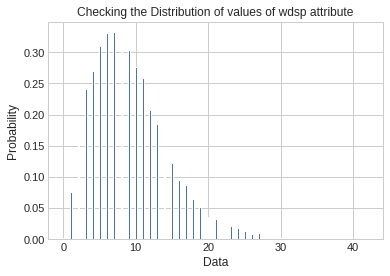

In [77]:
print('-----------Checking the Distribution of values of wdsp attribute -------------')

import scipy.stats as st
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

plt.hist(newdf['wdsp'], density=True, bins=170, label="Data")
mn, mx = plt.xlim()
plt.xlim(mn, mx)

plt.ylabel('Probability')
plt.xlabel('Data')
plt.title("Checking the Distribution of values of wdsp attribute");

-----------Checking the Distribution of values of ActualGenerationMW attribute -------------


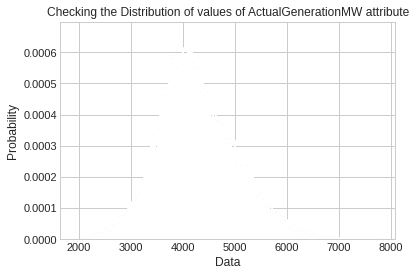

In [78]:
print('-----------Checking the Distribution of values of ActualGenerationMW attribute -------------')

# I have experimented a lot with the bins here
plt.hist(newdf['ActualGenerationMW'], density=True, bins=370, label="Data")
mn, mx = plt.xlim()
plt.xlim(mn, mx)

plt.ylabel('Probability')
plt.xlabel('Data')
plt.title("Checking the Distribution of values of ActualGenerationMW attribute");

#### Plotting distribution of all the values - historgrams ####

-----------Plotting the Distribution of numeric values -------------


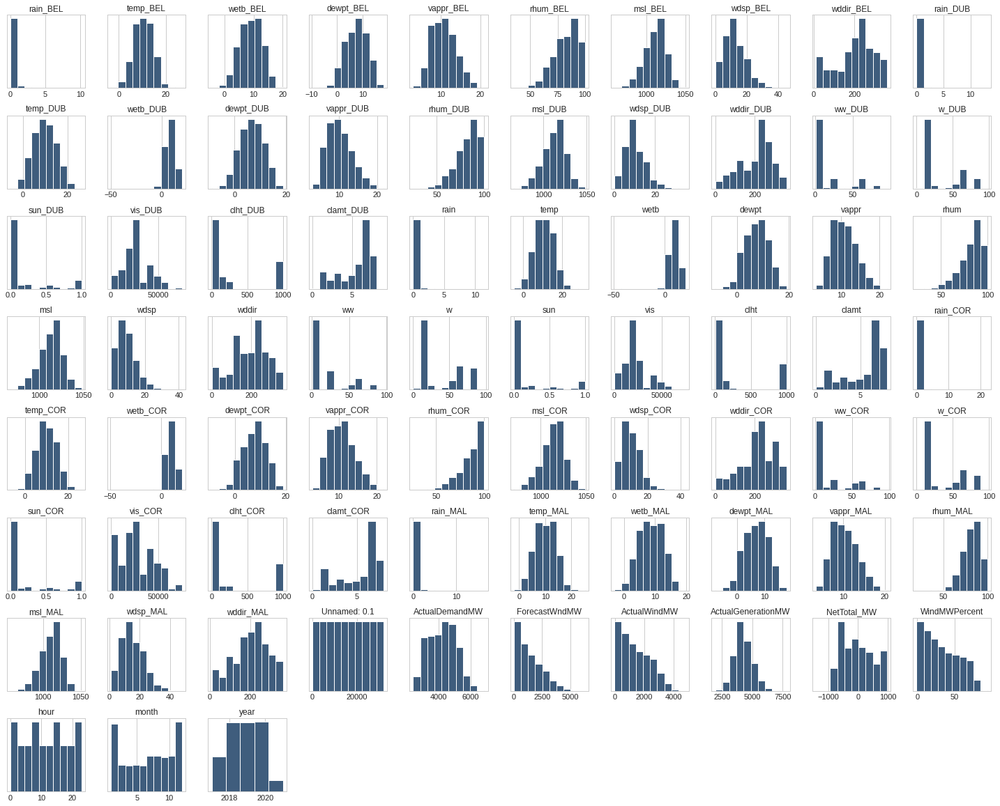

In [79]:
print('-----------Plotting the Distribution of numeric values -------------')

# This is not ideal yet and I improved it below. 
# I have tried to plot histograms of all attributes here in matrix mode to see its distributions.
# Catherine change start ---->

fig = plt.figure(figsize=(20, 20))

numerical_cols = [cname for cname in newdf.columns if 
                newdf[cname].dtype in ['int64', 'float64']]

# loop over all vars (total: 34)
for i in range(1, (len(numerical_cols)-1)):
    plt.subplot(10, 10, i)
    f = plt.gca()
    f.axes.get_yaxis().set_visible(False)
    f.axes.set_title(numerical_cols[i] )

    vals = np.size(newdf.loc[:, numerical_cols[i]].unique())
    #print("Hist" + numerical_cols[i] + " Unique Vals: " + str(vals))
    if vals < 10:
        bins = vals
    else:
        vals = 10

    if vals > 1:
      plt.hist(newdf.loc[:, numerical_cols[i]], bins=vals, color='#3F5D7D')

plt.tight_layout()

In [81]:
newdf.columns

Index(['Unnamed: 0', 'date', 'rain_BEL', 'temp_BEL', 'wetb_BEL', 'dewpt_BEL',
       'vappr_BEL', 'rhum_BEL', 'msl_BEL', 'wdsp_BEL', 'wddir_BEL', 'rain_DUB',
       'temp_DUB', 'wetb_DUB', 'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB',
       'wdsp_DUB', 'wddir_DUB', 'ww_DUB', 'w_DUB', 'sun_DUB', 'vis_DUB',
       'clht_DUB', 'clamt_DUB', 'rain', 'temp', 'wetb', 'dewpt', 'vappr',
       'rhum', 'msl', 'wdsp', 'wddir', 'ww', 'w', 'sun', 'vis', 'clht',
       'clamt', 'rain_COR', 'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR',
       'rhum_COR', 'msl_COR', 'wdsp_COR', 'wddir_COR', 'ww_COR', 'w_COR',
       'sun_COR', 'vis_COR', 'clht_COR', 'clamt_COR', 'rain_MAL', 'temp_MAL',
       'wetb_MAL', 'dewpt_MAL', 'vappr_MAL', 'rhum_MAL', 'msl_MAL', 'wdsp_MAL',
       'wddir_MAL', 'Unnamed: 0.1', 'ActualDemandMW', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'WindMWPercent',
       'hour', 'isweekday', 'month', 'year', 'TotalWindCapacityMW'],
      dtype='obj

-----------Creating the matrix of histograms/distriutions of all the attributes -------------


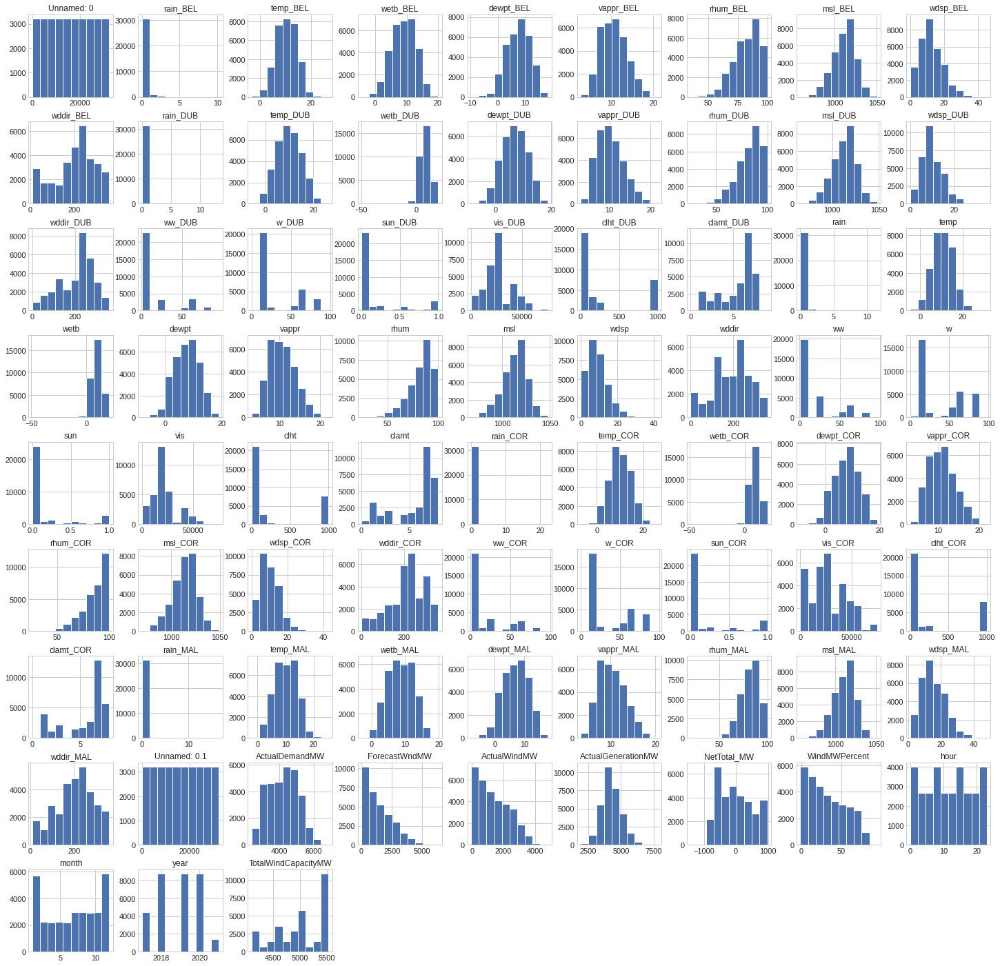

In [83]:
print('-----------Creating the matrix of histograms/distriutions of all the attributes -------------')

# I have tried to plot histograms of all attributes here in matrix mode to see its distributions.
# To do that I am defining matrix 25 vs 25 

fig = plt.figure(figsize = (25,25))
ax = fig.gca()


num_df = newdf.select_dtypes(['int', 'float'])
num_df.hist(ax=ax)
plt.show()

#### Checking unique values within the attribute range ####

In [84]:
print('----------- Checking unique attributes (and then unique without duplicates) for  sample column from the data -------------')

# Checking unique attributes (and then unique without duplicates) for  sample column from the data
newdf.rain_DUB.unique()
newdf.rain_DUB.drop_duplicates()

----------- Checking unique attributes (and then unique without duplicates) for  sample column from the data -------------


0         0.0
51        0.1
53        0.7
69        0.3
222       0.2
         ... 
25973    11.5
27036     4.3
27824     5.8
30275     5.6
30599     5.0
Name: rain_DUB, Length: 79, dtype: float64

#### Data understanding: Correlation of attributes between stations

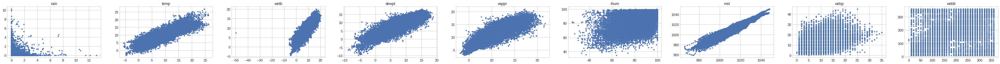

In [86]:
dubData = newdf[['rain_DUB', 'temp_DUB', 'wetb_DUB', 'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB', 'wddir_DUB', 'ww_DUB', 'w_DUB', 'sun_DUB', 'vis_DUB', 'clht_DUB', 'clamt_DUB']]
belData = newdf[['rain_BEL', 'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL', 'msl_BEL', 'wdsp_BEL', 'wddir_BEL']]
corData = newdf[['rain_COR', 'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR', 'wdsp_COR', 'wddir_COR', 'ww_COR', 'w_COR', 'sun_COR', 'vis_COR', 'clht_COR', 'clamt_COR']]
shaData = newdf[['rain', 'temp','wetb', 'dewpt', 'vappr', 'rhum', 'msl', 'wdsp', 'wddir', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt']]
attributes = ['rain',  'temp', 'wetb', 'dewpt', 'vappr', 'rhum', 'msl', 'wdsp', 'wddir', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt']

attrNum = len(belData.columns)
fig, axs = plt.subplots(1,attrNum)
fig.set_size_inches(56,3)
for i in range(0, attrNum):
  axs[i].plot(dubData.iloc[:,i],belData.iloc[:,i],'.')
  axs[i].set_title(attributes[i])


#### Data understanding 1: Checking how often/when it was raining a lot during the day in Dublin navigating by newdf.rain_DUB ####

----------- I am checking how often (at what hour) it was raining a lot during the day in Dublin navigating by newdf.rain_DUB -------------


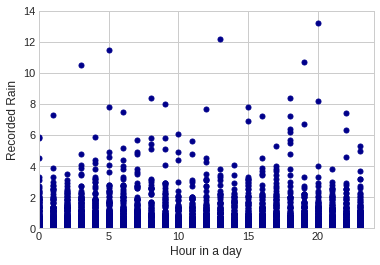

In [88]:
print('----------- I am checking how often (at what hour) it was raining a lot during the day in Dublin navigating by newdf.rain_DUB -------------')

# I am checking how often it was raining per day in Dublin navigating by newdf.rain_DUB)

# d = {c: newdf.loc[newdf['rain_DUB'] != 0, c].iat[0] for c in newdf}
# print (d)

# I am deriving the hour per each day (extracting the hour from date stamp)
newdf['hour'] = newdf.date.dt.hour
# print(newdf[['date','hour']])

# then I am selecting the measurement when it was raining
rain_DUB_non_zero = newdf[newdf["rain_DUB"] > 0]
# print(rain_DUB_non_zero[['date','hour', 'rain_DUB']])

# newdf.plot(x=rain_DUB_non_zero[['hour']], y=rain_DUB_non_zero[['rain_DUB']], style='o')

# plt.scatter(rain_DUB_non_zero[['hour']],rain_DUB_non_zero[['rain_DUB']], c='DarkBlue')

# The size of the marker is controlled by me by using the last size (s) parameter
plt.scatter(rain_DUB_non_zero[['hour']],rain_DUB_non_zero[['rain_DUB']], c='DarkBlue', s=5**2)

# I am setting OX as we have 24h per day
plt.xlabel('Hour in a day')
plt.xlim(0,24)

# I am setting OY to 14 as 13.2 this is close our max recorded value for that attribute
plt.ylabel('Recorded Rain')
plt.ylim(0,14)

plt.show()


#### Data understanding 2: Mean value of temperatures in weekdays when (rain_Bel == 0) ####

-----------Mean value of temperatures in weekdays when (rain_Bel == 0)-------------
dict_keys([2017.0, 2018.0, 2019.0, 2020.0, 2021.0])


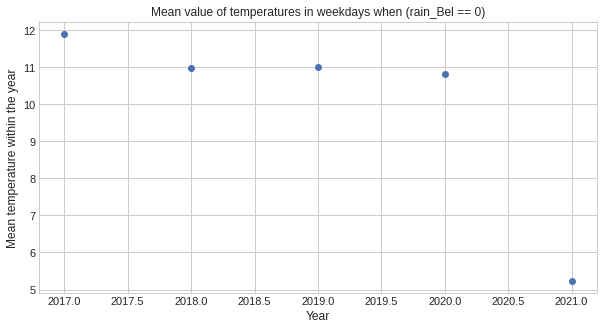

In [89]:
print('-----------Mean value of temperatures in weekdays when (rain_Bel == 0)-------------')

# print(newdf.isweekday.unique())

subset = newdf.query("rain_BEL==0 and isweekday==1")
# subset_t = pd.to_numeric(subset['temp'], errors='coerce')
# subset_h = pd.to_numeric(subset['hour'], errors='coerce')
# print(subset)

# Number of recorded values per each year
# subset['year'].value_counts()

# I am calculating the number of years in our data subset
print(subset.groupby(['year']).groups.keys())

# I am calculating the number of recorded temperatures in our data subset
# subset.groupby('year')['temp'].mean()

# I am calculating the number of dates each year
# subset.groupby('year')['temp'].count()

fig, ax = plt.subplots(figsize=(10, 5))
ax.scatter(subset.groupby(['year']).groups.keys(), subset.groupby('year')['temp'].mean())
ax.set(title = "Mean value of temperatures in weekdays when (rain_Bel == 0)",
       xlabel = "Year",
       ylabel = "Mean temperature within the year")
plt.show()

#### Data understanding 3: Max value of temperatures across all months and years ####

-----------Max value of temperatures across all months and years  -------------
dict_keys([1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0])


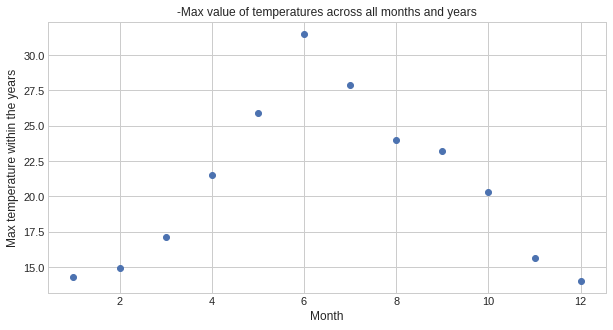

In [90]:
print('-----------Max value of temperatures across all months and years  -------------')

# I am calculating the number of years in our data subset
print(subset.groupby(['month']).groups.keys())

fig, ax = plt.subplots(figsize=(10, 5))
ax.scatter(subset.groupby(['month']).groups.keys(), subset.groupby('month')['temp'].max())
ax.set(title = "-Max value of temperatures across all months and years",
       xlabel = "Month",
       ylabel = "Max temperature within the years")
plt.show()

#### Data understanding 4: Max value of wind speed across all months and years ####

-----------Max value of wind speed across all months and years  -------------
dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 40])


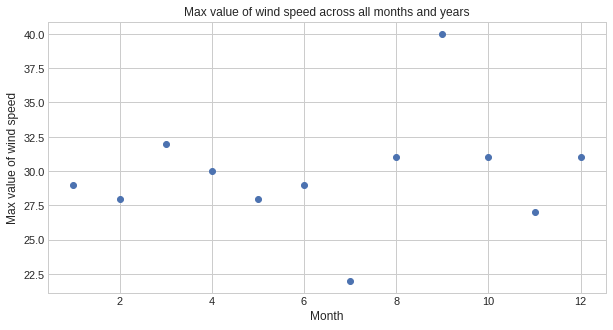

In [91]:
print('-----------Max value of wind speed across all months and years  -------------')

# I am calculating the number of years in our data subset
print(subset.groupby(['wdsp']).groups.keys())

fig, ax = plt.subplots(figsize=(10, 5))
ax.scatter(subset.groupby(['month']).groups.keys(), subset.groupby('month')['wdsp'].max())
ax.set(title = "Max value of wind speed across all months and years",
       xlabel = "Month",
       ylabel = "Max value of wind speed")
plt.show()

#### Data understanding 5.1: Checking wind speed by Month of each Year ####

-----------Checking wind speed by Month of each Year -------------


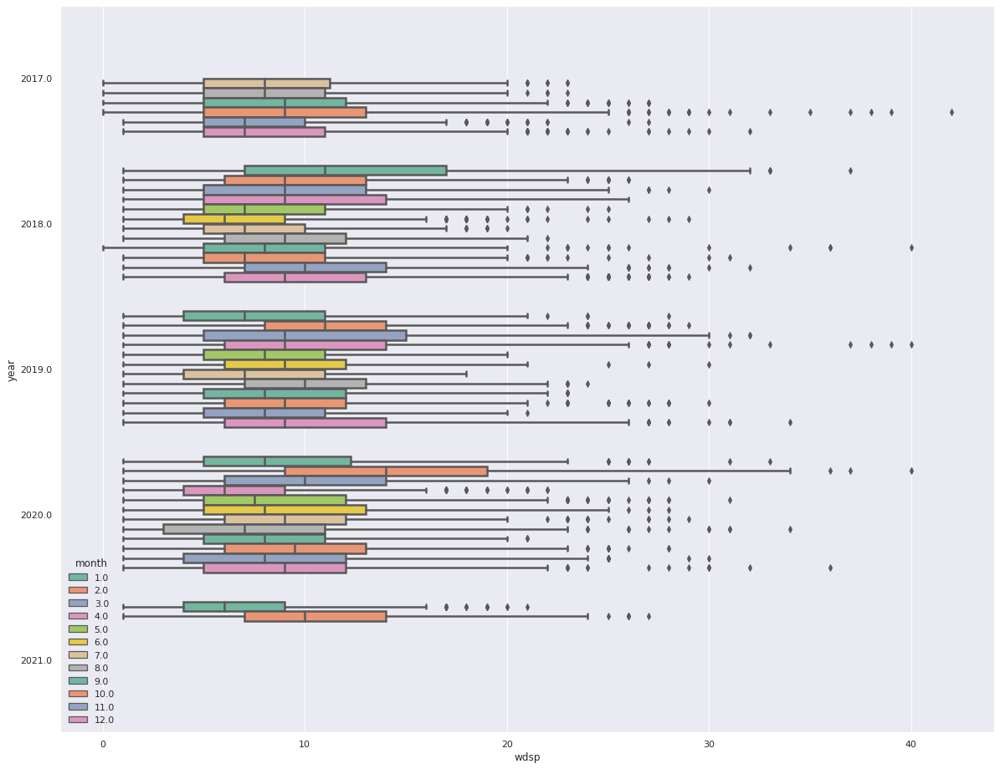

In [92]:
print('-----------Checking wind speed by Month of each Year -------------')

sns.set_theme(style="whitegrid")

years = newdf.groupby(['year']).groups.keys()
windspeed = newdf['wdsp']

# Wind speed by Year
# ax = sns.boxplot(x=windspeed, y=newdf['year'], data=newdf, linewidth=2.5, orient="h", palette="Set2", hue=newdf['year'])

# Wind speed by Month of each Year. I am doing trick to pass seaborn the width and hight as it is hard to control it by default
sns.set(rc={'figure.figsize':(20.0,16.00)})
ax = sns.boxplot(x=windspeed, y=newdf['year'], data=newdf, linewidth=2.5, orient="h", palette="Set2", hue=newdf['month'])

# ax = sns.catplot(x=windspeed, y=newdf['year'], data=newdf, hue=newdf['month'], 
#                   kind="box",
#                 height=4, aspect=.7
#                  )


#### Data understanding 5.2: Checking the Actual Demand wind speed by Month of each Year ####

-----------Checking wind speed by yeach date -------------


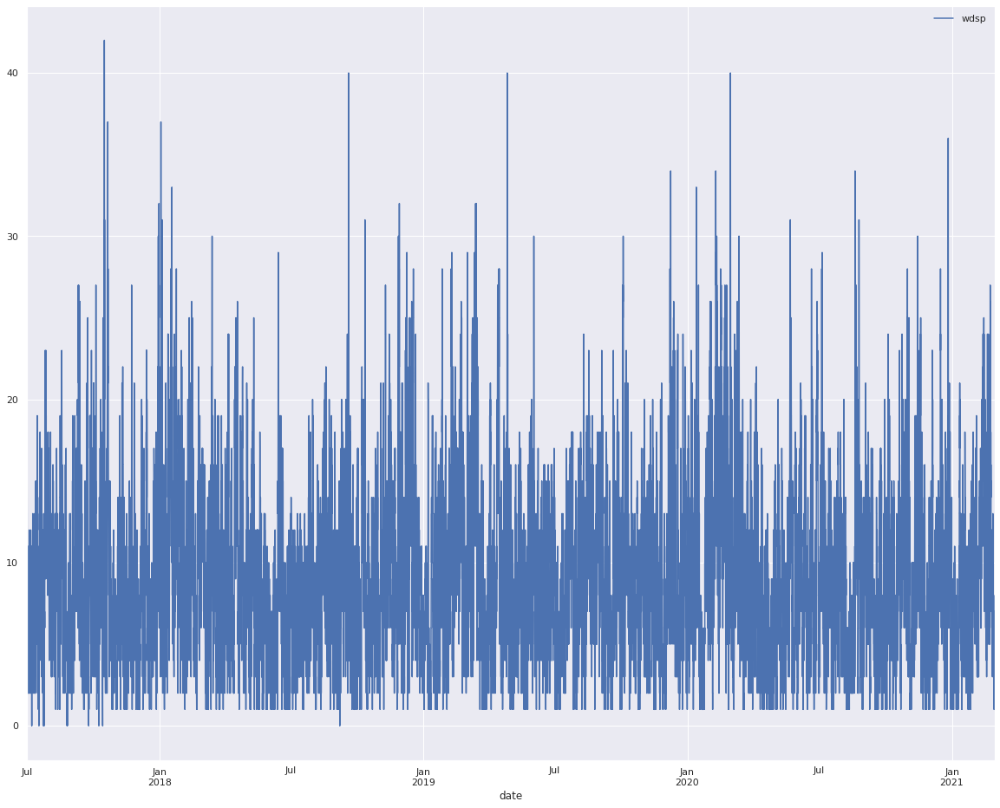

In [93]:
print('-----------Checking wind speed by yeach date -------------')
series = pd.Series(list(range(len(newdf))))

newdf.plot(x='date', y='wdsp')

#### Data understanding 5.3: Checking Wind-Speed & Actual Demand by week

In [94]:
windData = newdf.copy(deep=True)
windData = windData[['date', 'year', 'ActualDemandMW', 'ForecastWndMW', 'ActualWindMW', 'ActualGenerationMW', 'hour', 'isweekday', 'month']]
# 'DayTime', 
#windData['date'] = pd.to_datetime(windData['date'], format='%Y-%m-%d %H:%M', errors='ignore')
windData['Week'] = windData['date'].apply(lambda x: x.isocalendar()[1])
windData['isoYear'] = windData['date'].apply(lambda x: x.isocalendar()[0])
windData['Day_inYear'] = windData['date'].apply(lambda x: x.timetuple().tm_yday)
windData['Month'] = windData['date'].apply(lambda x: x.month)
windData['Year'] = windData['date'].apply(lambda x: x.year)

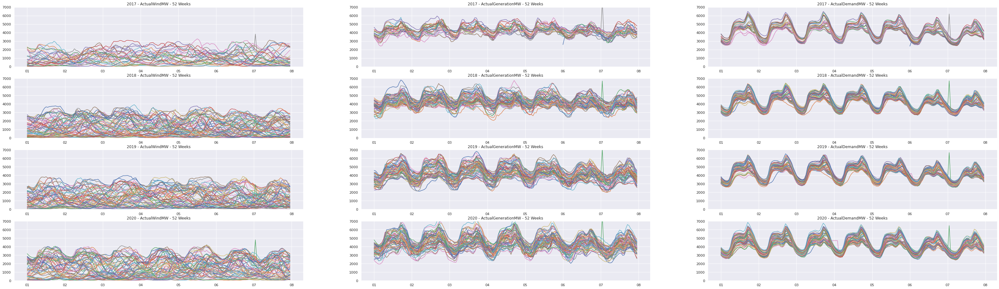

In [95]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from datetime import tzinfo, timedelta, datetime, date
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates

years = [2017, 2018, 2019, 2020]
attributes = ['ActualWindMW', 'ActualGenerationMW', 'ActualDemandMW']

date_form = DateFormatter("%d")

fig, axs = plt.subplots(4,3)
fig.set_size_inches(56,16)

for row in range(0,4):
  yearData = windData[windData.isoYear == years[row]].reset_index(drop=True)
  yearData = yearData[yearData.Year == years[row]].reset_index(drop=True)
  for w in yearData.Week.unique():
    weekData = yearData[yearData.Week == w].reset_index(drop=True)

    weekData.Year = 2020
    weekData.Month = 1
    weekData['Day'] = weekData.date.dt.weekday + 1
    weekData['Time'] = weekData.date.dt.time
    x_Time = pd.to_datetime(weekData[['Year','Month','Day','Time']].astype(str).apply(' '.join, 1), format='%Y %m %d %H:%M')

    for col in range(0,3):
      axs[row, col].plot(x_Time, weekData[attributes[col]], label = 'Week-'+str(w))

      axs[row, col].set_title(str(years[row]) + ' - ' + attributes[col] + ' - 52 Weeks')
      axs[row, col].xaxis.set_major_formatter(date_form)
      axs[row, col].xaxis.set_major_locator(mdates.DayLocator(interval=1))
      axs[row, col].set_ylim([0, 7000])

#### Data understanding 5.4: Checking Wind-Speed & Actual Demand by day

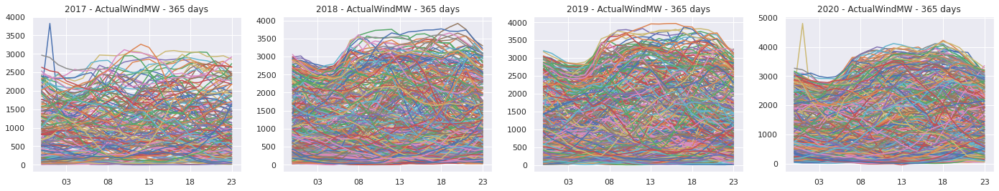

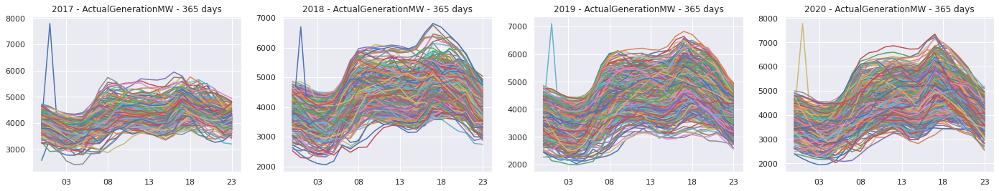

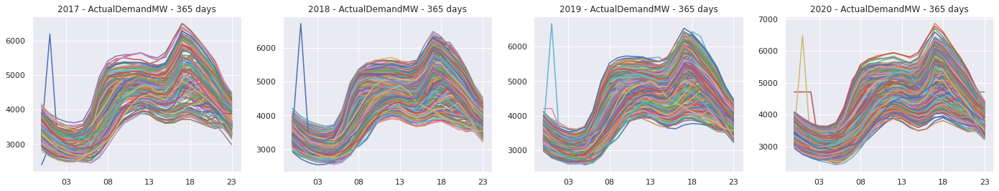

In [96]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from datetime import tzinfo, timedelta, datetime, date
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates

years = [2017, 2018, 2019, 2020]
attributes = ['ActualWindMW', 'ActualGenerationMW', 'ActualDemandMW']

date_form = DateFormatter("%H")

for attr in attributes:

  fig, axs = plt.subplots(1,4)
  fig.set_size_inches(24,4)

  for i in range(0,4):
    yearData = windData[windData.year == years[i]].reset_index(drop=True)
    for d in yearData.Day_inYear.unique():
      dayData = yearData[yearData.Day_inYear == d].reset_index(drop=True)

      dayData.year = 2020
      dayData.Month = 1
      dayData['Day'] = 1
      dayData['Time'] = weekData.date.dt.time
      x_Time = pd.to_datetime(dayData[['year','Month','Day','Time']].astype(str).apply(' '.join, 1), format='%Y %m %d %H:%M')
      axs[i].plot(x_Time, dayData[attr], label = 'Day-'+str(d))

    axs[i].set_title(str(years[i]) + ' - ' + attr + ' - 365 days')
    axs[i].xaxis.set_major_formatter(date_form)
    axs[i].xaxis.set_major_locator(mdates.HourLocator(interval=5))

##### Data understanding 5.4.1: Actual Demand: Weekday vs Weekend

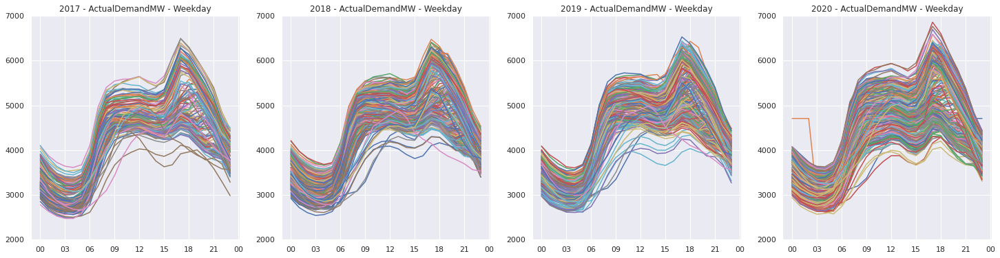

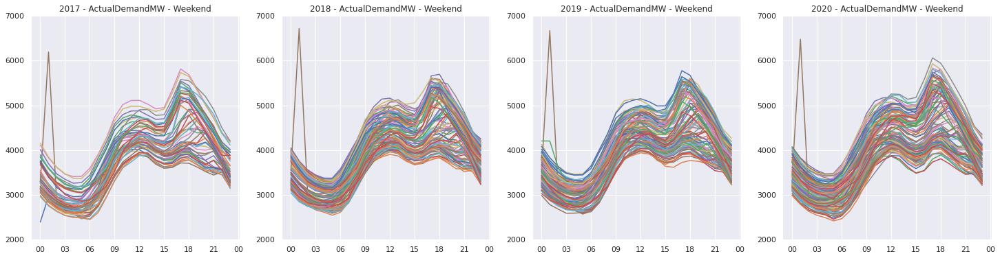

In [97]:
attr = 'ActualDemandMW'

fig_weekDay, axs_weekDay = plt.subplots(1,4)
fig_weekDay.set_size_inches(25,6)

fig_weekEnd, axs_weekEnd = plt.subplots(1,4)
fig_weekEnd.set_size_inches(25,6)

date_form = DateFormatter("%H")


for i in range(0,4):
  yearData = windData[windData.year == years[i]].reset_index(drop=True)
  for d in yearData.Day_inYear.unique():
    dayData = yearData[yearData.Day_inYear == d].reset_index(drop=True)
    isWeekDay = dayData.isweekday
    dayData.year = 2020
    dayData.Month = 1
    dayData['Day'] = 1
    dayData['Time'] = weekData.date.dt.time
    x_Time = pd.to_datetime(dayData[['Year','Month','Day','Time']].astype(str).apply(' '.join, 1), format='%Y %m %d %H:%M')

    if isWeekDay[0] == True:
      axs_weekDay[i].plot(x_Time, dayData[attr], label = 'Day-'+str(d))
    else:
      axs_weekEnd[i].plot(x_Time, dayData[attr], label = 'Day-'+str(d))


    axs[i].plot(x_Time, dayData[attr], label = 'Day-'+str(d))

  axs_weekDay[i].set_title(str(years[i]) + ' - ' + 'ActualDemandMW - Weekday')
  axs_weekDay[i].xaxis.set_major_formatter(date_form)
  axs_weekDay[i].set_ylim([2000, 7000])
  
  axs_weekEnd[i].set_title(str(years[i]) + ' - ' + 'ActualDemandMW - Weekend')
  axs_weekEnd[i].xaxis.set_major_formatter(date_form)
  axs_weekEnd[i].set_ylim([2000, 7000])

#### Data understanding 5: Checking the a pairwise relationships between these three attributes ####

-----------Checking the a pairwise relationships between these three attributes -------------


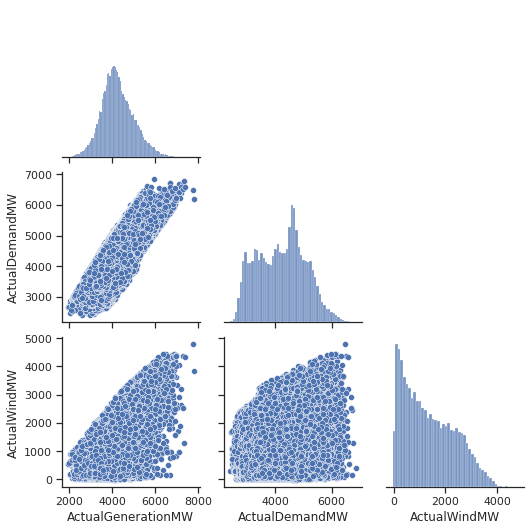

In [98]:
print('-----------Checking the a pairwise relationships between these three attributes -------------')
sns.set_theme(style="ticks")
sns.pairplot(newdf[['ActualGenerationMW','ActualDemandMW', 'ActualWindMW']], corner=True)

-----------Checking the a pairwise relationships between these three attributes -------------
-----------It is similar to above pairwise relationships but the trend is better visible -------------


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9559f3bc10>,
      dtype=object)

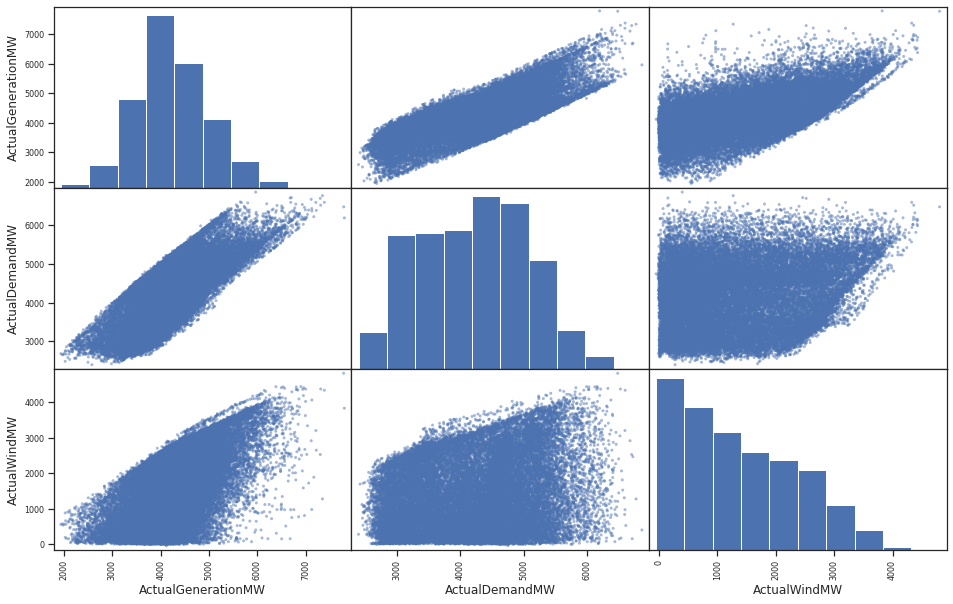

In [99]:
print('-----------Checking the a pairwise relationships between these three attributes -------------')
print('-----------It is similar to above pairwise relationships but the trend is better visible -------------')

pd.plotting.scatter_matrix(newdf[['ActualGenerationMW','ActualDemandMW', 'ActualWindMW']], alpha=0.5,  figsize=(16, 10))

#### Checking the correlation between these three attributes

-----------Checking the correlation between selected attributes -------------


(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 <a list of 7 Text major ticklabel objects>)

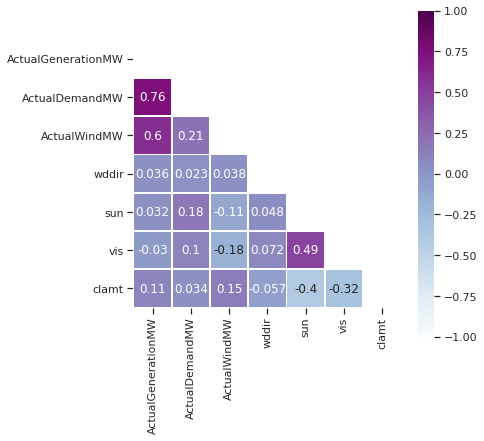

In [100]:
print('-----------Checking the correlation between selected attributes -------------')

# I am defining them here as the subset (we can check the whole dataset)
attributes = ['ActualGenerationMW','ActualDemandMW', 'ActualWindMW', 'wddir','sun', 'vis', 'clamt']
newdf_corr = newdf.loc[:, attributes].corr()

# Then I am generating a mask for the upper triangle
mask = np.triu(np.ones_like(newdf_corr, dtype=bool))
plt.figure(figsize=[6, 6])

# and finally I am plotting the interavtive triangle with the correlation coefficients
sns.heatmap(data=newdf_corr, mask=mask, vmin=-1, vmax=1, cmap='BuPu', annot=True, square=True, linewidths=1)
plt.xticks(rotation=90)
plt.yticks(rotation=0)

# New Section

In [101]:
import plotly.express as px

fig = px.scatter(newdf, x='date', y='ActualDemandMW')
fig.show()

In [102]:
newdf.loc[newdf['month'].isnull() == True]

,Unnamed: 0,date,rain_BEL,temp_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,wdsp_BEL,wddir_BEL,rain_DUB,temp_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,wdsp_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,clht_DUB,clamt_DUB,rain,temp,wetb,dewpt,vappr,rhum,msl,wdsp,wddir,ww,w,sun,vis,clht,clamt,rain_COR,temp_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,wdsp_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,rain_MAL,temp_MAL,wetb_MAL,dewpt_MAL,vappr_MAL,rhum_MAL,msl_MAL,wdsp_MAL,wddir_MAL,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,isweekday,month,year,TotalWindCapacityMW


In [103]:
fig = px.scatter(newdf, x='hour', y='ActualDemandMW', facet_col='month', color='isweekday')
fig.show()

In [104]:
fig = px.scatter(newdf, x='hour', y='ActualDemandMW', facet_col='year', color='isweekday')
fig.show()

In [105]:
newdf['WindGenPercent'] = (newdf['ActualWindMW'] / newdf['ActualGenerationMW']) * 100
fig = px.scatter(newdf, x='hour', y='WindGenPercent', facet_col='year')
fig.show()

#To be described


*   Distribution of key attributes (for example, the target attribute of a prediction task)
*   Relationships between pairs or small numbers of attributes
*   Results of simple aggregations
*   Properties of significant sub-populations
*   Simple statistical analyses
*   Is the data complete (does it cover all the cases required)?
*   Is it correct, or does it contain errors and, if there are errors, how common are they?
*   Are there missing values in the data? If so, how are they represented, where do they occur, and how common are they?

*   Did you plot univariate and multivariate summaries of the data?
*   Did you check for outliers?
*   Did you identify the missing data code?
*   Is each variable one column?
*   Is each observation one row?
*   Do different data types appear in each table?
*   Did you record the recipe for moving from raw to tidy data?*   Did you create a code book?6. Did you record all parameters, units, and functions applied to the data?
*   Did you identify missing values?
*   Did you make univariate plots (histograms, density plots, boxplots)?
*   Did you consider correlations between variables *   (scatterplots)?
*   Did you check the units of all data points to make sure they are in the right range?
*   Did you try to identify any errors or miscoding of variables?
*   Did you consider plotting on a log scale?
*   Would a scatterplot be more informative?
*   Correlation

calculation of summary statistics

Univariate non-graphical EDA
https://www.stat.cmu.edu/~hseltman/309/Book/chapter4.pdf


#### Additional materials ####

<a href="https://www.youtube.com/embed/2GC3VcB0gLY" target="_blank"><img src="https://img.youtube.com/vi/2GC3VcB0gLY/0.jpg" 
alt="Krystian's recommendation video" width="240" height="180" border="10" /></a>